# Gentrification of London Districts Analysis

### Load libraries

In [2]:
import pandas as pd
import numpy as np 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Libraries imported.


In [268]:
CLIENT_ID = 'RRKVNG2J2POAMW1SKDPLLMAHQXRNN2IGKNXCQXFK34ELQBS5' # your Foursquare ID
CLIENT_SECRET = '1W4BHI0ULJHVYUJS2Z43BOUJGZ1YKOHZYR502WEUQZVJLNMM' # your Foursquare Secret
VERSION = '20180604'

Y5RDSVQ24GVFOO2PT1I1VDHNJ0N2FK1EAGGLHAHBXODLIVOZ

In [4]:
address = 'London, England'

geolocator = Nominatim(user_agent="foursquare_agent")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of London is {}, {}.'.format(latitude, longitude))

The geograpical coordinate of London is 51.5073219, -0.1276474.


### Import London district data

In [18]:
ldn = pd.read_html("https://en.wikipedia.org/wiki/List_of_areas_of_London")[1]
ldn.head()

,Location,London borough,Post town,Postcode district,Dial code,OS grid ref
0,Abbey Wood,"Bexley, Greenwich [7]",LONDON,SE2,020,TQ465785
1,Acton,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4",020,TQ205805
2,Addington,Croydon[8],CROYDON,CR0,020,TQ375645
3,Addiscombe,Croydon[8],CROYDON,CR0,020,TQ345665
4,Albany Park,Bexley,"BEXLEY, SIDCUP","DA5, DA14",020,TQ478728


In [20]:
cols = ldn.columns.values
ldn.drop([cols[2],cols[4],cols[5]], axis=1, inplace=True)
ldn.columns = ['District', 'Borough', 'Postcode']

In [21]:
for idx, borough in enumerate(ldn['Borough']):
    if borough[-1] == ']':
        ldn['Borough'][idx] = borough[0:borough.index('[')]

for idx, pcode in enumerate(ldn['Postcode']):
    if '(' in pcode:
        ldn['Postcode'][idx] = pcode[0:pcode.index('(')-1]
    elif ',' in pcode:
        ldn['Postcode'][idx] = pcode[0:pcode.index(',')]

for idx, borough in enumerate(ldn['Borough']):
    if ',' in borough:
        ldn['Borough'][idx] = borough[0:borough.index(',')]
ldn

,District,Borough,Postcode
0,Abbey Wood,Bexley,SE2
1,Acton,Ealing,W3
2,Addington,Croydon,CR0
3,Addiscombe,Croydon,CR0
4,Albany Park,Bexley,DA5
5,Aldborough Hatch,Redbridge,IG2
6,Aldgate,City,EC3
7,Aldwych,Westminster,WC2
8,Alperton,Brent,HA0
9,Anerley,Bromley,SE20


In [22]:
ldn.shape

(533, 3)

In [23]:
districts_to_compare = []
for district in ldn['District']:
    if '(' in district:
        districts_to_compare.append(district)
print(districts_to_compare)

districts_to_compare_ = []
for item in districts_to_compare:
    
    districts_to_compare_.append(item.split('(also'))
districts_to_compare_

districts_to_compare_flat= [item for sublist in districts_to_compare_ for item in sublist]
districts_to_compare_flat

districts_to_compare_final = []
for item in districts_to_compare_flat:
    districts_to_compare_final.append(item.split(','))
districts_to_compare_final = [item for sublist in districts_to_compare_final for item in sublist]
districts_to_compare_final

while districts_to_compare_final[2][0] == ' ':
    for idx, item in enumerate(districts_to_compare_final):
        if item[-1] == ')':
            districts_to_compare_final[idx] = item[0:item.index(')')]
        elif item[0] == ' ':
            districts_to_compare_final[idx] = item[1:]
        elif item[-1] == ' ':
            districts_to_compare_final[idx] = item[0:-1]
districts_to_compare_final

['Barnet (also Chipping Barnet, High Barnet)', 'Bexley (also Old Bexley, Bexley Village)', 'Bexleyheath (also Bexley New Town)', 'Bromley (also Bromley-by-Bow)', 'Marylebone (also St Marylebone)', 'Sydenham (also Lower Sydenham, Upper Sydenham)', 'Widmore (also Widmore Green)']


['Barnet',
 'Chipping Barnet',
 'High Barnet',
 'Bexley',
 'Old Bexley',
 'Bexley Village',
 'Bexleyheath',
 'Bexley New Town',
 'Bromley',
 'Bromley-by-Bow',
 'Marylebone',
 'St Marylebone',
 'Sydenham',
 'Lower Sydenham',
 'Upper Sydenham',
 'Widmore',
 'Widmore Green']

### Load avg house prices per London ward data 

In [24]:
house_prices = pd.read_excel("https://data.london.gov.uk/download/average-house-prices/fb8116f5-06f8-42e0-aa6c-b0b1bd69cdba/land-registry-house-prices-ward.xls", 'Mean')
house_prices.head()

,New code,Ward name,Borough name,Year ending Dec 1995,Year ending Mar 1996,Year ending Jun 1996,Year ending Sep 1996,Year ending Dec 1996,Year ending Mar 1997,Year ending Jun 1997,Year ending Sep 1997,Year ending Dec 1997,Year ending Mar 1998,Year ending Jun 1998,Year ending Sep 1998,Year ending Dec 1998,Year ending Mar 1999,Year ending Jun 1999,Year ending Sep 1999,Year ending Dec 1999,Year ending Mar 2000,Year ending Jun 2000,Year ending Sep 2000,Year ending Dec 2000,Year ending Mar 2001,Year ending Jun 2001,Year ending Sep 2001,Year ending Dec 2001,Year ending Mar 2002,Year ending Jun 2002,Year ending Sep 2002,Year ending Dec 2002,Year ending Mar 2003,Year ending Jun 2003,Year ending Sep 2003,Year ending Dec 2003,Year ending Mar 2004,Year ending Jun 2004,Year ending Sep 2004,Year ending Dec 2004,Year ending Mar 2005,Year ending Jun 2005,Year ending Sep 2005,Year ending Dec 2005,Year ending Mar 2006,Year ending Jun 2006,Year ending Sep 2006,Year ending Dec 2006,Year ending Mar 2007,Year ending Jun 2007,Year ending Sep 2007,Year ending Dec 2007,Year ending Mar 2008,Year ending Jun 2008,Year ending Sep 2008,Year ending Dec 2008,Year ending Mar 2009,Year ending Jun 2009,Year ending Sep 2009,Year ending Dec 2009,Year ending Mar 2010,Year ending Jun 2010,Year ending Sep 2010,Year ending Dec 2010,Year ending Mar 2011,Year ending Jun 2011,Year ending Sep 2011,Year ending Dec 2011,Year ending Mar 2012,Year ending Jun 2012,Year ending Sep 2012,Year ending Dec 2012,Year ending Mar 2013,Year ending Jun 2013,Year ending Sep 2013,Year ending Dec 2013,Year ending Mar 2014,Year ending Jun 2014,Year ending Sep 2014,Year ending Dec 2014,Year ending Mar 2015,Year ending Jun 2015,Year ending Sep 2015,Year ending Dec 2015,Year ending Mar 2016,Year ending Jun 2016,Year ending Sep 2016,Year ending Dec 2016,Year ending Mar 2017,Year ending Jun 2017,Year ending Sep 2017,Year ending Dec 2017
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,E09000001,City of London,City of London,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-
2,E05000026,Abbey,Barking and Dagenham,51077.6,49868.8,49901.6,51935.1,50766.5,50189.5,47807.5,48004.6,51318.4,53046,56650.8,62273.5,62804.7,63424.2,63438.1,63157.9,65332.4,68244.8,71096.9,75373.6,80500.4,83991.6,87614.5,89086.1,90385.2,92632.6,100613,112160,118552,126999,134844,140395,144717,148276,151551,155472,159623,161342,163806,169466,170132,170449,171864,173013,176475,176514,178030,178175,181406,183043,185865,188033,180628,177795,177714,163750,158897,159104,156474,165191,165780,168864,172656,175014,177209,170681,176299,172658,168027,176779,175155,177891,176408,180841,188359,192992,195076,196981,197438,200307,205772,213651,221505,230617,255508,257490,260566,265572,259487
3,E05000027,Alibon,Barking and Dagenham,45490.4,44701.5,44486,45894.1,46145.1,47019.2,48608.8,50142.5,51232.4,51968.8,52586.1,54027.2,56402.5,56893,58167.7,58898.7,61551.2,64046.1,67629.7,71554.5,75254.2,79877.6,84528.1,87147.8,91596.8,93874.7,96758.8,104538,110035,117384,127092,134008,140970,145105,149821,152314,154618,157495,160115,162515,161242,160215,158112,158940,161536,163952,169377,177297,182354,186749,189167,190669,190602,183746,173878,162602,153115,151919,153737,156158,157753,161871,162656,160216,163659,159781,160041,160778,162153,168090,170990,174547,176047,184072,189424,199446,207385,211848,217023,220636,224947,244132,258467,275653,288472,287671,282210,284011,283397
4,E05000028,Becontree,Barking and Dagenham,48947.6,49655.6,50129.2,51113.3,52333.8,54958.4,56108.9,56414.5,56734.9,55058.4,55249.1,56023

In [25]:
house_prices.drop(0, axis=0, inplace=True)
house_prices.drop(house_prices.columns.values[0], axis=1, inplace= True)
house_prices.rename(columns={house_prices.columns.values[0]:"District", house_prices.columns.values[1]:"Borough"}, inplace=True)

In [26]:
house_prices

,District,Borough,Year ending Dec 1995,Year ending Mar 1996,Year ending Jun 1996,Year ending Sep 1996,Year ending Dec 1996,Year ending Mar 1997,Year ending Jun 1997,Year ending Sep 1997,Year ending Dec 1997,Year ending Mar 1998,Year ending Jun 1998,Year ending Sep 1998,Year ending Dec 1998,Year ending Mar 1999,Year ending Jun 1999,Year ending Sep 1999,Year ending Dec 1999,Year ending Mar 2000,Year ending Jun 2000,Year ending Sep 2000,Year ending Dec 2000,Year ending Mar 2001,Year ending Jun 2001,Year ending Sep 2001,Year ending Dec 2001,Year ending Mar 2002,Year ending Jun 2002,Year ending Sep 2002,Year ending Dec 2002,Year ending Mar 2003,Year ending Jun 2003,Year ending Sep 2003,Year ending Dec 2003,Year ending Mar 2004,Year ending Jun 2004,Year ending Sep 2004,Year ending Dec 2004,Year ending Mar 2005,Year ending Jun 2005,Year ending Sep 2005,Year ending Dec 2005,Year ending Mar 2006,Year ending Jun 2006,Year ending Sep 2006,Year ending Dec 2006,Year ending Mar 2007,Year ending Jun 2007,Year ending Sep 2007,Year ending Dec 2007,Year ending Mar 2008,Year ending Jun 2008,Year ending Sep 2008,Year ending Dec 2008,Year ending Mar 2009,Year ending Jun 2009,Year ending Sep 2009,Year ending Dec 2009,Year ending Mar 2010,Year ending Jun 2010,Year ending Sep 2010,Year ending Dec 2010,Year ending Mar 2011,Year ending Jun 2011,Year ending Sep 2011,Year ending Dec 2011,Year ending Mar 2012,Year ending Jun 2012,Year ending Sep 2012,Year ending Dec 2012,Year ending Mar 2013,Year ending Jun 2013,Year ending Sep 2013,Year ending Dec 2013,Year ending Mar 2014,Year ending Jun 2014,Year ending Sep 2014,Year ending Dec 2014,Year ending Mar 2015,Year ending Jun 2015,Year ending Sep 2015,Year ending Dec 2015,Year ending Mar 2016,Year ending Jun 2016,Year ending Sep 2016,Year ending Dec 2016,Year ending Mar 2017,Year ending Jun 2017,Year ending Sep 2017,Year ending Dec 2017
1,City of London,City of London,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-
2,Abbey,Barking and Dagenham,51077.6,49868.8,49901.6,51935.1,50766.5,50189.5,47807.5,48004.6,51318.4,53046,56650.8,62273.5,62804.7,63424.2,63438.1,63157.9,65332.4,68244.8,71096.9,75373.6,80500.4,83991.6,87614.5,89086.1,90385.2,92632.6,100613,112160,118552,126999,134844,140395,144717,148276,151551,155472,159623,161342,163806,169466,170132,170449,171864,173013,176475,176514,178030,178175,181406,183043,185865,188033,180628,177795,177714,163750,158897,159104,156474,165191,165780,168864,172656,175014,177209,170681,176299,172658,168027,176779,175155,177891,176408,180841,188359,192992,195076,196981,197438,200307,205772,213651,221505,230617,255508,257490,260566,265572,259487
3,Alibon,Barking and Dagenham,45490.4,44701.5,44486,45894.1,46145.1,47019.2,48608.8,50142.5,51232.4,51968.8,52586.1,54027.2,56402.5,56893,58167.7,58898.7,61551.2,64046.1,67629.7,71554.5,75254.2,79877.6,84528.1,87147.8,91596.8,93874.7,96758.8,104538,110035,117384,127092,134008,140970,145105,149821,152314,154618,157495,160115,162515,161242,160215,158112,158940,161536,163952,169377,177297,182354,186749,189167,190669,190602,183746,173878,162602,153115,151919,153737,156158,157753,161871,162656,160216,163659,159781,160041,160778,162153,168090,170990,174547,176047,184072,189424,199446,207385,211848,217023,220636,224947,244132,258467,275653,288472,287671,282210,284011,283397
4,Becontree,Barking and Dagenham,48947.6,49655.6,50129.2,51113.3,52333.8,54958.4,56108.9,56414.5,56734.9,55058.4,55249.1,56023.7,59766.9,62637,62674.1,64187,64516.1,66972.7,70926,73232.7,75620.1,77807.5,79803.3,85751.4,93981.2,96165.5,101658,109561,115972,123263,131190,136216,141341,145867,149869,154854,158305,160994,163850,162417,161636,161378,163974,168070,172854,177888,182430,187240,192434,194861,194724,195482,197443,196964,193676,178611,160855,161117,172468,179873,189463,187073,182533,179436,180886,187025,186365,186316,178859,174327,177814,1

In [27]:
house_prices.shape

(630, 91)

In [28]:
keep = []
for item in districts_to_compare_final:
    for place in house_prices['District']:
        if item == place:
            keep.append(item)        
keep

['High Barnet', 'Sydenham']

In [29]:
for idx, item in enumerate(ldn['District']):
    if keep[0] in item and '(' in item:
        ldn['District'][idx] = keep[0]
    elif keep[1] in item and '(' in item:
        ldn['District'][idx] = keep[1]
    elif '(' in item:
        ldn['District'][idx] = item[0:item.index('(')-1]
        

In [30]:
ldn

,District,Borough,Postcode
0,Abbey Wood,Bexley,SE2
1,Acton,Ealing,W3
2,Addington,Croydon,CR0
3,Addiscombe,Croydon,CR0
4,Albany Park,Bexley,DA5
5,Aldborough Hatch,Redbridge,IG2
6,Aldgate,City,EC3
7,Aldwych,Westminster,WC2
8,Alperton,Brent,HA0
9,Anerley,Bromley,SE20


### Retrieve coordinates for London districts

In [33]:
latitudes = []
longitudes = []
for row in ldn.iterrows():
    try:
        add = f"{row[1][0]}, {row[1][1]}, {row[1][2]}" 
        location = geolocator.geocode(add)
        latitudes.append(location.latitude)
        longitudes.append(location.longitude)
        print(f'The geograpical coordinate of {add} is {location.latitude}, {location.longitude}.')
    except:
        latitudes.append(np.nan)
        longitudes.append(np.nan)
        print(f'The geograpical coordinate of {add} is not found')

The geograpical coordinate of Abbey Wood, Bexley, SE2 is 51.4958468, 0.1277077.
The geograpical coordinate of Acton, Ealing, W3 is 51.5081402, -0.2732607.
The geograpical coordinate of Addington, Croydon, CR0 is 51.3428357, -0.0117415.
The geograpical coordinate of Addiscombe, Croydon, CR0 is 51.3676737, -0.0952496.
The geograpical coordinate of Albany Park, Bexley, DA5 is 51.4361034, 0.1259205.
The geograpical coordinate of Aldborough Hatch, Redbridge, IG2 is not found
The geograpical coordinate of Aldgate, City, EC3 is 51.5132705, -0.0776592.
The geograpical coordinate of Aldwych, Westminster, WC2 is 51.5116345, -0.1190235.
The geograpical coordinate of Alperton, Brent, HA0 is 51.5410769, -0.3008855.
The geograpical coordinate of Anerley, Bromley, SE20 is 51.4075993, -0.0619394.
The geograpical coordinate of Angel, Islington, EC1 is 51.5319458, -0.1061056.
The geograpical coordinate of Aperfield, Bromley, TN16 is 51.3166288, 0.0327167.
The geograpical coordinate of Archway, Islington

The geograpical coordinate of Chislehurst, Bromley, BR7 is 51.4115718, 0.0769545.
The geograpical coordinate of Chiswick, Hounslow, W4 is 51.4923137, -0.263818.
The geograpical coordinate of Church End, Brent, NW10 is 51.5775626, -0.22021.
The geograpical coordinate of Church End, Barnet, N3 is 51.601117, -0.1918901.
The geograpical coordinate of Clapham, Lambeth, SW4 is 51.4622924, -0.1388561.
The geograpical coordinate of Clerkenwell, Islington, EC1 is 51.5237268, -0.1055555.
The geograpical coordinate of Cockfosters, Barnet, EN4 is 51.6473586, -0.1473902.
The geograpical coordinate of Colindale, Barnet, NW9 is 51.5954091, -0.2499296.
The geograpical coordinate of Collier Row, Havering, RM5 is 51.599912, 0.1615162.
The geograpical coordinate of Colliers Wood, Merton, SW19 is 51.4182747, -0.1778626.
The geograpical coordinate of Colney Hatch, Barnet, N11 is 51.6025172, -0.1480126.
The geograpical coordinate of Colyers, Bexley, DA8 is 51.4715367, 0.1701003.
The geograpical coordinate o

The geograpical coordinate of Grove Park, Hounslow, W4 is not found
The geograpical coordinate of Grove Park, Lewisham, SE12 is 51.4318969, 0.0212344.
The geograpical coordinate of Gunnersbury, Hounslow, W4 is 51.4920088, -0.2753987.
The geograpical coordinate of Hackney, Hackney, E5 is 51.5432402, -0.0493621.
The geograpical coordinate of Hackney Central, Hackney, E8 is 51.5470605, -0.0568749.
The geograpical coordinate of Hackney Marshes, Hackney, E9 is 51.55649645, -0.029171864933870008.
The geograpical coordinate of Hackney Wick, Hackney, E9 is 51.5517981, -0.0204303.
The geograpical coordinate of Hadley Wood, Enfield, EN4 is 51.671485, -0.1611613.
The geograpical coordinate of Haggerston, Hackney, E2 is 51.5385184, -0.0753811.
The geograpical coordinate of Hainault, Redbridge, IG7 is 51.6082858, 0.1057866.
The geograpical coordinate of The Hale, Barnet, NW7 is 51.6143576, -0.2519438.
The geograpical coordinate of Ham, Richmond upon Thames, TW10 is 51.4347641, -0.3092987.
The geogr

The geograpical coordinate of Lower Morden, Merton, SM4 is 51.3897736, -0.2163635.
The geograpical coordinate of Loxford, Redbridge, IG1 is 51.5481943, 0.084051.
The geograpical coordinate of Maida Vale, Westminster, W9 is 51.5297928, -0.1857906.
The geograpical coordinate of Malden Rushett, Kingston upon Thames, KT9 is not found
The geograpical coordinate of Manor House, Hackney, N4 is 51.5703208, -0.0963971.
The geograpical coordinate of Manor Park, Newham, E12 is 51.55252965, 0.04648097551728238.
The geograpical coordinate of Marks Gate, Barking and Dagenham, RM6 is 51.5863692, 0.1348482.
The geograpical coordinate of Maryland, Newham, E15 is 51.5460532, 0.0059223.
The geograpical coordinate of Marylebone, Westminster, W1 is 51.5220589, -0.1504553.
The geograpical coordinate of Mayfair, Westminster, W1 is 51.5110872, -0.147058.
The geograpical coordinate of Maze Hill, Greenwich, SE10 is 51.4829513, 0.0014988.
The geograpical coordinate of Merton Park, Merton, SW19 is 51.4079938, -0.

The geograpical coordinate of Rush Green, Barking and Dagenham, RM7 is not found
The geograpical coordinate of Ruxley, Bexley, DA14 is 51.4143345, 0.1326256.
The geograpical coordinate of Sanderstead, Croydon, CR2 is 51.3340837, -0.0767435.
The geograpical coordinate of Sands End, Hammersmith and Fulham, SW6 is 51.4725454, -0.1871122.
The geograpical coordinate of Selhurst, Croydon, SE25 is 51.3922136, -0.0886537.
The geograpical coordinate of Selsdon, Croydon, CR2 is 51.3443067, -0.0607688.
The geograpical coordinate of Seven Kings, Redbridge, IG3 is 51.56468595, 0.09829662288770635.
The geograpical coordinate of Seven Sisters, Haringey, N15 is 51.5827673, -0.0751158.
The geograpical coordinate of Shacklewell, Hackney, E8 is 51.5523761, -0.0701582.
The geograpical coordinate of Shadwell, Tower Hamlets, E1 is 51.5105939, -0.0588693.
The geograpical coordinate of Shepherd's Bush, Hammersmith and Fulham, W12 is 51.505314, -0.2229007.
The geograpical coordinate of Shirley, Croydon, CR0 is

The geograpical coordinate of Walworth, Southwark, SE17 is 51.4901142, -0.0906603.
The geograpical coordinate of Wandsworth, Wandsworth, SW18 is 51.4570271, -0.1932607.
The geograpical coordinate of Wanstead, Redbridge, E11 is 51.575646, 0.0286373.
The geograpical coordinate of Wapping, Tower Hamlets, E1 is 51.5054363, -0.0587291.
The geograpical coordinate of Wealdstone, Harrow, HA3 is 51.5936353, -0.3294758.
The geograpical coordinate of Well Hall, Greenwich, SE9 is 51.4574683, 0.0501437.
The geograpical coordinate of Welling, Bexley, DA16 is not found
The geograpical coordinate of Wembley, Brent, HA0 is 51.5531547, -0.2957562.
The geograpical coordinate of Wembley Park, Brent, HA9 is 51.5638718, -0.2810213.
The geograpical coordinate of Wennington, Havering, RM13 is 51.5170251, 0.1937893.
The geograpical coordinate of West Brompton, Kensington and Chelsea, SW10 is 51.4869765, -0.1951854.
The geograpical coordinate of West Drayton, Hillingdon, UB7 is 51.503513, -0.4662704.
The geogra

In [34]:
ldn['Latitude'] = latitudes
ldn['Longitude'] = longitudes
ldn.dropna(axis =0, inplace=True)
ldn.reset_index(drop=True, inplace=True)

In [35]:
ldn

,District,Borough,Postcode,Latitude,Longitude
0,Abbey Wood,Bexley,SE2,51.495847,0.127708
1,Acton,Ealing,W3,51.508140,-0.273261
2,Addington,Croydon,CR0,51.342836,-0.011742
3,Addiscombe,Croydon,CR0,51.367674,-0.095250
4,Albany Park,Bexley,DA5,51.436103,0.125920
5,Aldgate,City,EC3,51.513270,-0.077659
6,Aldwych,Westminster,WC2,51.511634,-0.119024
7,Alperton,Brent,HA0,51.541077,-0.300885
8,Anerley,Bromley,SE20,51.407599,-0.061939
9,Angel,Islington,EC1,51.531946,-0.106106


ldn.shape = 500

### Map of london with all districts

In [36]:
# create map of London using latitude and longitude values
map_ldn = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, district in zip(ldn['Latitude'], ldn['Longitude'], ldn['Borough'], ldn['District']):
    if lat != np.nan:
        label = '{}, {}'.format(district, borough)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color='blue',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(map_ldn)  
    
map_ldn

### Merge dataframes to get house prices for districts

In [37]:
ldn_prices = ldn.merge(house_prices, on='District')

In [38]:
ldn_prices.sort_values('District')

,District,Borough_x,Postcode,Latitude,Longitude,Borough_y,Year ending Dec 1995,Year ending Mar 1996,Year ending Jun 1996,Year ending Sep 1996,Year ending Dec 1996,Year ending Mar 1997,Year ending Jun 1997,Year ending Sep 1997,Year ending Dec 1997,Year ending Mar 1998,Year ending Jun 1998,Year ending Sep 1998,Year ending Dec 1998,Year ending Mar 1999,Year ending Jun 1999,Year ending Sep 1999,Year ending Dec 1999,Year ending Mar 2000,Year ending Jun 2000,Year ending Sep 2000,Year ending Dec 2000,Year ending Mar 2001,Year ending Jun 2001,Year ending Sep 2001,Year ending Dec 2001,Year ending Mar 2002,Year ending Jun 2002,Year ending Sep 2002,Year ending Dec 2002,Year ending Mar 2003,Year ending Jun 2003,Year ending Sep 2003,Year ending Dec 2003,Year ending Mar 2004,Year ending Jun 2004,Year ending Sep 2004,Year ending Dec 2004,Year ending Mar 2005,Year ending Jun 2005,Year ending Sep 2005,Year ending Dec 2005,Year ending Mar 2006,Year ending Jun 2006,Year ending Sep 2006,Year ending Dec 2006,Year ending Mar 2007,Year ending Jun 2007,Year ending Sep 2007,Year ending Dec 2007,Year ending Mar 2008,Year ending Jun 2008,Year ending Sep 2008,Year ending Dec 2008,Year ending Mar 2009,Year ending Jun 2009,Year ending Sep 2009,Year ending Dec 2009,Year ending Mar 2010,Year ending Jun 2010,Year ending Sep 2010,Year ending Dec 2010,Year ending Mar 2011,Year ending Jun 2011,Year ending Sep 2011,Year ending Dec 2011,Year ending Mar 2012,Year ending Jun 2012,Year ending Sep 2012,Year ending Dec 2012,Year ending Mar 2013,Year ending Jun 2013,Year ending Sep 2013,Year ending Dec 2013,Year ending Mar 2014,Year ending Jun 2014,Year ending Sep 2014,Year ending Dec 2014,Year ending Mar 2015,Year ending Jun 2015,Year ending Sep 2015,Year ending Dec 2015,Year ending Mar 2016,Year ending Jun 2016,Year ending Sep 2016,Year ending Dec 2016,Year ending Mar 2017,Year ending Jun 2017,Year ending Sep 2017,Year ending Dec 2017
0,Abbey Wood,Bexley,SE2,51.495847,0.127708,Greenwich,46278.4,47470.2,46562.3,46827.1,49205.7,48997.7,49966.1,52283.7,54557.4,56360.2,58773.5,60984.8,63367.6,64609.8,65522.9,66301,68162.8,69452.1,73676,78048,80949.7,85767.8,87503.7,92114,96684.9,101342,106645,113885,121492,128947,135804,141532,147667,150910,155305,158197,161244,165986,164851,164420,162627,161897,165381,166809,170983,172200,174697,177402,178731,183192,185585,187880,190400,189378,181487,174972,170302,171176,172504,172616,175411,173524,173568,175260,170271,169781,170114,172461,174681,177787,179801,180478,191184,198389,207436,230334,247468,253276,263259,258075,282209,295853,303772,318638,326788,331603,333927,339017,341509
1,Addiscombe,Croydon,CR0,51.367674,-0.095250,Croydon,58136.2,56418,56878.7,57114.7,56781.4,58149.8,60069.8,62740.2,64934.4,66555,68152.7,70091.9,72664,74607.2,76910.7,82385.2,87009.7,90676.8,95063.3,98527.5,104634,109919,115450,120595,122480,126702,133691,141595,152704,161723,170660,176177,179115,179742,179193,184448,188291,191905,197816,194372,194601,194442,193678,194445,199548,204394,207507,219359,224383,227716,232647,231435,225671,219124,211395,200806,197635,199387,201987,206876,212961,213534,213215,216081,214570,211618,216001,216251,215528,220939,216763,217290,224951,228720,235598,248184,261702,273020,283286,291629,299690,312384,322977,337965,348185,360749,360145,359777,364156
2,Alperton,Brent,HA0,51.541077,-0.300885,Brent,57641.2,58597.4,58688.9,57154.9,57972.4,57824.6,60968.4,63026.6,67009.3,70068,71187,75047.6,75492.4,77133.5,80883,84391.4,89565.1,94199,98307.4,102421,106586,110261,127122,136096,141028,142722,138069,144882,151493,160780,167379,169403,180182,189596,196236,202971,208785,205453,207728,211883,201630,201871,203389,203014,208383,212315,213014,223792,225629,232094,239631,231873,233537,224979,202804,196833,200240,207389,213186,229187,228673,225439,225559,226898,226420,220411,219722,214154,217328,227980,229975,234479,232869,238266,247162,254368,264108,270565,285778,310044,318105,344342,360831,381743,388502,396071,376249,366799,368782
3,Balham,

ldn_prices.shape = 194

### Map of London with only the districts retained from dataframe merging

In [39]:
# create map of London using latitude and longitude values
map_ldnprices = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, district in zip(ldn_prices['Latitude'], ldn_prices['Longitude'], ldn_prices['Borough_x'], ldn_prices['District']):
    if lat != np.nan:
        label = '{}, {}'.format(district, borough)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color='blue',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(map_ldnprices)  
    
map_ldnprices

### Get Venue data from Foursquare

In [202]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['District', 
                  'District Latitude', 
                  'District Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [155]:
LIMIT=100
radius=1000
ldn_venues = getNearbyVenues(names=ldn_prices['District'],
                                   latitudes=ldn_prices['Latitude'],
                                   longitudes=ldn_prices['Longitude'], radius
                                  )

Abbey Wood
Addiscombe
Alperton
Balham
Barkingside
Barnehurst
Barnes
High Barnet
Barnsbury
Bayswater
Beckton
Becontree
Bellingham
Belmont
Belmont
Belmont
Belmont
Belvedere
Berrylands
Bethnal Green
Bickley
Biggin Hill
Blackheath
Bloomsbury
Brentford
Brockley
Brunswick Park
Brunswick Park
Burnt Oak
Canary Wharf
Canonbury
Chadwell Heath
Charlton
Cheam
Childs Hill
Chislehurst
Church End
Church End
Clerkenwell
Cockfosters
Colindale
Colliers Wood
Colyers
Cranford
Crofton Park
Crouch End
Crystal Palace
Custom House
Dalston
Dollis Hill
Downham
Earlsfield
East Barnet
East Dulwich
East Finchley
East Sheen
Edgware
Edgware
Elm Park
Emerson Park
Enfield Highway
Enfield Lock
Erith
Finsbury Park
Forest Hill
Fortis Green
Gipsy Hill
Golders Green
Goodmayes
Gospel Oak
Grove Park
Hackney Central
Hackney Wick
Haggerston
Hainault
Hampton
Hampton Wick
Hanworth
Harefield
Harlesden
Harold Wood
Harringay
Harrow on the Hill
Harrow Weald
Hatch End
Hendon
Herne Hill
Highgate
Highgate
Holloway
Homerton
Hornsey
Isle

In [156]:
ldn_venues.groupby('District').count()

,District Latitude,District Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
District,,,,,,
Abbey Wood,7,7,7,7,7,7
Addiscombe,69,69,69,69,69,69
Alperton,19,19,19,19,19,19
Balham,52,52,52,52,52,52
Barkingside,13,13,13,13,13,13
Barnehurst,57,57,57,57,57,57
Barnes,49,49,49,49,49,49
Barnsbury,100,100,100,100,100,100
Bayswater,100,100,100,100,100,100


In [157]:
ldn_venues.head()

,District,District Latitude,District Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abbey Wood,51.495847,0.127708,Lesnes Abbey,51.489526,0.125839,Historic Site
1,Abbey Wood,51.495847,0.127708,Lidl,51.496152,0.118417,Supermarket
2,Abbey Wood,51.495847,0.127708,Sainsbury's,51.492826,0.120524,Supermarket
3,Abbey Wood,51.495847,0.127708,Abbey Wood Railway Station (ABW),51.490825,0.123432,Train Station
4,Abbey Wood,51.495847,0.127708,Southmere Lake,51.499354,0.123837,Lake


In [129]:
print('There are {} uniques categories.'.format(len(ldn_venues['Venue Category'].unique())))

There are 298 uniques categories.


In [158]:
# one hot encoding
ldn_onehot = pd.get_dummies(ldn_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
ldn_onehot['District'] = ldn_venues['District'] 

# move neighborhood column to the first column
cols = list(ldn_onehot.columns.values)
cols = cols[cols.index('District'):]+cols[:cols.index('District')]

ldn_onehot = ldn_onehot[cols]

ldn_onehot.head()


,District,Accessories Store,Acupuncturist,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bar,Baseball Field,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Rental / Bike Share,Bike Shop,Bistro,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Buddhist Temple,Buffet,Bulgarian Restaurant,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Canal,Canal Lock,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Caucasian Restaurant,Champagne Bar,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Cigkofte Place,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Roaster,Coffee Shop,College Football Field,College Soccer Field,Comedy Club,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cricket Ground,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Doner Restaurant,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Field,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hunan Restaurant,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Laser Tag,Latin American Restaurant,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Military Base,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,New American Restaurant,Nightclub,Noodle House,North Indian Restaurant,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Other Repair Shop,Outdoor Gym,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Outlet Mall,Outlet Store,Paintball Field,Pakistani Restaurant,Palace,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Photography Studio,Pie Shop,Pier,Pilates Studio,Pizza Place,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Portuguese Restaurant,Post Office,Print Shop,Pub,Public Art,RV Park,Rafting,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Rental Car Locati

In [159]:
ldn_onehot.shape

(8279, 367)

In [160]:
ldn_grouped = ldn_onehot.groupby('District').mean().reset_index()
ldn_grouped

,District,Accessories Store,Acupuncturist,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bar,Baseball Field,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Rental / Bike Share,Bike Shop,Bistro,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Buddhist Temple,Buffet,Bulgarian Restaurant,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Canal,Canal Lock,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Caucasian Restaurant,Champagne Bar,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Cigkofte Place,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Roaster,Coffee Shop,College Football Field,College Soccer Field,Comedy Club,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cricket Ground,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Doner Restaurant,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Field,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hunan Restaurant,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Laser Tag,Latin American Restaurant,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Military Base,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,New American Restaurant,Nightclub,Noodle House,North Indian Restaurant,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Other Repair Shop,Outdoor Gym,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Outlet Mall,Outlet Store,Paintball Field,Pakistani Restaurant,Palace,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Photography Studio,Pie Shop,Pier,Pilates Studio,Pizza Place,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Portuguese Restaurant,Post Office,Print Shop,Pub,Public Art,RV Park,Rafting,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Rental Car Locati

In [161]:
ldn_grouped.shape

(183, 367)

In [229]:
num_top_venues = 5

for hood in ldn_grouped['District']:
    print("----"+hood+"----")
    temp = ldn_grouped[ldn_grouped['District'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Abbey Wood----
           venue  freq
0    Supermarket  0.29
1            Pub  0.14
2  Train Station  0.14
3  Historic Site  0.14
4           Lake  0.14


----Addiscombe----
                      venue  freq
0                       Pub  0.10
1               Coffee Shop  0.07
2        Italian Restaurant  0.06
3  Mediterranean Restaurant  0.04
4                 Bookstore  0.04


----Alperton----
                  venue  freq
0           Supermarket  0.11
1     Indian Restaurant  0.11
2  Fast Food Restaurant  0.11
3        Hardware Store  0.05
4     Food & Drink Shop  0.05


----Balham----
                venue  freq
0                 Pub  0.17
1         Coffee Shop  0.15
2  Italian Restaurant  0.08
3         Pizza Place  0.08
4                Café  0.06


----Barkingside----
                venue  freq
0         Supermarket  0.23
1            Pharmacy  0.08
2  Athletics & Sports  0.08
3       Grocery Store  0.08
4                Park  0.08


----Barnehurst----
                  venue

               venue  freq
0               Café  0.12
1                Pub  0.10
2  Indian Restaurant  0.07
3          Gastropub  0.07
4       Burger Joint  0.05


----East Finchley----
           venue  freq
0            Pub  0.11
1       Bus Stop  0.07
2    Coffee Shop  0.07
3  Grocery Store  0.07
4           Café  0.07


----East Sheen----
           venue  freq
0            Pub  0.18
1    Coffee Shop  0.11
2    Pizza Place  0.07
3  Grocery Store  0.07
4           Park  0.07


----Edgware----
              venue  freq
0  Sushi Restaurant  0.08
1          Pharmacy  0.08
2       Coffee Shop  0.08
3            Bakery  0.08
4              Park  0.05


----Elm Park----
           venue  freq
0  Grocery Store  0.27
1         Bakery  0.09
2       Bus Stop  0.09
3  Metro Station  0.09
4           Café  0.09


----Emerson Park----
           venue  freq
0           Café  0.17
1  Grocery Store  0.17
2         Garden  0.08
3    Supermarket  0.08
4           Park  0.08


----Enfield Highway----

4        Gas Station  0.08


----Merton Park----
                venue  freq
0       Grocery Store  0.11
1         Supermarket  0.09
2  Italian Restaurant  0.06
3   Indian Restaurant  0.06
4                 Pub  0.06


----Mile End----
               venue  freq
0                Pub  0.14
1               Café  0.07
2        Art Gallery  0.05
3  Convenience Store  0.05
4       Burger Joint  0.05


----Mill Hill----
           venue  freq
0  Metro Station  0.12
1       Bus Stop  0.12
2      Gastropub  0.12
3        Stables  0.12
4           Park  0.12


----New Addington----
               venue  freq
0       Tram Station  0.29
1      Acupuncturist  0.14
2      Grocery Store  0.14
3        Supermarket  0.14
4  Convenience Store  0.14


----New Cross----
           venue  freq
0            Pub  0.13
1  Grocery Store  0.08
2    Coffee Shop  0.07
3           Café  0.07
4          Hotel  0.04


----Newington----
                venue  freq
0                 Pub  0.13
1                Café  0

                  venue  freq
0           Coffee Shop  0.08
1                   Pub  0.07
2                  Café  0.07
3         Grocery Store  0.05
4  Fast Food Restaurant  0.04


----Tottenham Hale----
            venue  freq
0             Pub  0.07
1   Grocery Store  0.07
2     Coffee Shop  0.07
3  Clothing Store  0.03
4     Pizza Place  0.03


----Totteridge----
               venue  freq
0        Golf Course  0.25
1     Cricket Ground  0.25
2                Pub  0.25
3               Lake  0.25
4  Accessories Store  0.00


----Tulse Hill----
           venue  freq
0            Pub  0.13
1    Coffee Shop  0.10
2  Grocery Store  0.10
3           Café  0.07
4           Park  0.07


----Upminster----
           venue  freq
0    Coffee Shop  0.12
1            Pub  0.12
2       Platform  0.12
3           Park  0.08
4  Grocery Store  0.08


----Upper Norwood----
         venue  freq
0          Pub  0.10
1  Coffee Shop  0.10
2         Café  0.07
3         Park  0.07
4  Pizza Place  0.05



In [163]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [232]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['District']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
districts_venues_sorted= []
districts_venues_sorted = pd.DataFrame(columns=columns)
districts_venues_sorted['District'] = ldn_grouped['District']

for ind in np.arange(ldn_grouped.shape[0]):
    districts_venues_sorted.iloc[ind, 1:] = return_most_common_venues(ldn_grouped.iloc[ind, :], num_top_venues)

districts_venues_sorted.head()

,District,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Wood,Supermarket,Lake,Pub,Convenience Store,Train Station,Historic Site,Flower Shop,Farm,Farmers Market,Fast Food Restaurant
1,Addiscombe,Pub,Coffee Shop,Italian Restaurant,Bookstore,Mediterranean Restaurant,Indian Restaurant,Hotel,Portuguese Restaurant,Asian Restaurant,Platform
2,Alperton,Indian Restaurant,Supermarket,Fast Food Restaurant,Asian Restaurant,Hookah Bar,Electronics Store,Clothing Store,Hardware Store,Café,Soccer Field
3,Balham,Pub,Coffee Shop,Italian Restaurant,Pizza Place,Café,Bakery,French Restaurant,Steakhouse,Bar,Indian Restaurant
4,Barkingside,Supermarket,Pub,Pizza Place,Fast Food Restaurant,Grocery Store,Park,Sandwich Place,Pharmacy,Athletics & Sports,Coffee Shop


#### Getting only the high level venue categroies

In [275]:
categories_url = 'https://api.foursquare.com/v2/venues/categories?client_id={}&client_secret={}&v={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION)
            
# make the GET request
results = requests.get(categories_url).json()

In [276]:
len(results['response']['categories'])

10

In [410]:
# Let's print only the top-level categories and their IDs and also add them to categories_list
categories_list = []
def print_categories(categories, level=0, max_level=0):    
    if level>max_level: return
    out = ''
    out += '-'*level
    for category in categories:
        print(out + category['name'] + ' (' + category['id'] + ')')
        print_categories(category['categories'], level+1, max_level)
        categories_list.append((category['name'], category['id']))
        
print_categories(results['response']['categories'], 0, 0)

Arts & Entertainment (4d4b7104d754a06370d81259)
College & University (4d4b7105d754a06372d81259)
Event (4d4b7105d754a06373d81259)
Food (4d4b7105d754a06374d81259)
Nightlife Spot (4d4b7105d754a06376d81259)
Outdoors & Recreation (4d4b7105d754a06377d81259)
Professional & Other Places (4d4b7105d754a06375d81259)
Residence (4e67e38e036454776db1fb3a)
Shop & Service (4d4b7105d754a06378d81259)
Travel & Transport (4d4b7105d754a06379d81259)


In [207]:
def GetVenuesCount(lat,lng, radius, categoryId):
    explore_url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&radius={}&categoryId={}'.format(
                CLIENT_ID, 
                CLIENT_SECRET, 
                VERSION,
                lat,
                lng,
                radius,
                categoryId)

    # make the GET request
    return requests.get(explore_url).json()['response']['totalResults']

#### Create new dataframe to store venues data

In [293]:
df_venues = ldn_prices.copy()
for c in categories_list:
    df_venues[c[0]] = 0
    
df_venues.head()

,District,Borough_x,Postcode,Latitude,Longitude,Borough_y,Dec 1995,Mar 1996,Jun 1996,Sep 1996,Dec 1996,Mar 1997,Jun 1997,Sep 1997,Dec 1997,Mar 1998,Jun 1998,Sep 1998,Dec 1998,Mar 1999,Jun 1999,Sep 1999,Dec 1999,Mar 2000,Jun 2000,Sep 2000,Dec 2000,Mar 2001,Jun 2001,Sep 2001,Dec 2001,Mar 2002,Jun 2002,Sep 2002,Dec 2002,Mar 2003,Jun 2003,Sep 2003,Dec 2003,Mar 2004,Jun 2004,Sep 2004,Dec 2004,Mar 2005,Jun 2005,Sep 2005,Dec 2005,Mar 2006,Jun 2006,Sep 2006,Dec 2006,Mar 2007,Jun 2007,Sep 2007,Dec 2007,Mar 2008,Jun 2008,Sep 2008,Dec 2008,Mar 2009,Jun 2009,Sep 2009,Dec 2009,Mar 2010,Jun 2010,Sep 2010,Dec 2010,Mar 2011,Jun 2011,Sep 2011,Dec 2011,Mar 2012,Jun 2012,Sep 2012,Dec 2012,Mar 2013,Jun 2013,Sep 2013,Dec 2013,Mar 2014,Jun 2014,Sep 2014,Dec 2014,Mar 2015,Jun 2015,Sep 2015,Dec 2015,Mar 2016,Jun 2016,Sep 2016,Dec 2016,Mar 2017,Jun 2017,Sep 2017,Dec 2017,Arts & Entertainment,College & University,Event,Food,Nightlife Spot,Outdoors & Recreation,Professional & Other Places,Residence,Shop & Service,Travel & Transport
0,Abbey Wood,Bexley,SE2,51.495847,0.127708,Greenwich,46278.4,47470.2,46562.3,46827.1,49205.7,48997.7,49966.1,52283.7,54557.4,56360.2,58773.5,60984.8,63367.6,64609.8,65522.9,66301,68162.8,69452.1,73676,78048,80949.7,85767.8,87503.7,92114,96684.9,101342,106645,113885,121492,128947,135804,141532,147667,150910,155305,158197,161244,165986,164851,164420,162627,161897,165381,166809,170983,172200,174697,177402,178731,183192,185585,187880,190400,189378,181487,174972,170302,171176,172504,172616,175411,173524,173568,175260,170271,169781,170114,172461,174681,177787,179801,180478,191184,198389,207436,230334,247468,253276,263259,258075,282209,295853,303772,318638,326788,331603,333927,339017,341509,0,0,0,0,0,0,0,0,0,0
1,Addiscombe,Croydon,CR0,51.367674,-0.095250,Croydon,58136.2,56418,56878.7,57114.7,56781.4,58149.8,60069.8,62740.2,64934.4,66555,68152.7,70091.9,72664,74607.2,76910.7,82385.2,87009.7,90676.8,95063.3,98527.5,104634,109919,115450,120595,122480,126702,133691,141595,152704,161723,170660,176177,179115,179742,179193,184448,188291,191905,197816,194372,194601,194442,193678,194445,199548,204394,207507,219359,224383,227716,232647,231435,225671,219124,211395,200806,197635,199387,201987,206876,212961,213534,213215,216081,214570,211618,216001,216251,215528,220939,216763,217290,224951,228720,235598,248184,261702,273020,283286,291629,299690,312384,322977,337965,348185,360749,360145,359777,364156,0,0,0,0,0,0,0,0,0,0
2,Alperton,Brent,HA0,51.541077,-0.300885,Brent,57641.2,58597.4,58688.9,57154.9,57972.4,57824.6,60968.4,63026.6,67009.3,70068,71187,75047.6,75492.4,77133.5,80883,84391.4,89565.1,94199,98307.4,102421,106586,110261,127122,136096,141028,142722,138069,144882,151493,160780,167379,169403,180182,189596,196236,202971,208785,205453,207728,211883,201630,201871,203389,203014,208383,212315,213014,223792,225629,232094,239631,231873,233537,224979,202804,196833,200240,207389,213186,229187,228673,225439,225559,226898,226420,220411,219722,214154,217328,227980,229975,234479,232869,238266,247162,254368,264108,270565,285778,310044,318105,344342,360831,381743,388502,396071,376249,366799,368782,0,0,0,0,0,0,0,0,0,0
3,Balham,Wandsworth,SW12,51.443352,-0.152869,Wandsworth,121877,120807,121691,135179,140407,144394,151338,153078,161158,171233,177033,196280,197343,205898,214818,215734,231516,240849,259227,283975,296068,307109,306762,305486,301799,301826,309226,333819,337306,336218,335737,331664,353174,363207,373146,384247,378730,387568,389022,383536,394112,400009,407503,438601,459994,468052,513346,532454,544427,560648,555958,528288,493456,481233,485178,535620,586735,609415,623730,624491,613678,613981,616057,633936,645914,663107,675287,694352,722083,681042,676429,686303,663753,705824,742399,789095,812069,795082,821703,815695,873664,905590,916677,910273,897394,909919,851739,878882,888156,0,0,0,0,0,0,0,0,0,0
4,Barkingside,Redbridge,IG6,51.588247,0.080450,Redbridge,82587.8,84411.9,83820.8,87662,90260.4,89812.8,91806.3,91810.9,92705.8,96309.5,101957,108926,113234,

In [294]:
#Request number of venues, store result as CSV
for i, row in df_venues.iterrows():
    for c in categories_list:        
        df_venues.loc[i, c[0]] = GetVenuesCount(df_venues.Latitude.iloc[i], df_venues.Longitude.iloc[i], radius=1000, categoryId=c[1])
    print(i)
    df_venues.to_csv('area_venues.csv')


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193


In [407]:
df_venues=pd.read_csv('area_venues.csv', index_col=0)
df_venues

,District,Borough_x,Postcode,Latitude,Longitude,Borough_y,Dec 1995,Mar 1996,Jun 1996,Sep 1996,Dec 1996,Mar 1997,Jun 1997,Sep 1997,Dec 1997,Mar 1998,Jun 1998,Sep 1998,Dec 1998,Mar 1999,Jun 1999,Sep 1999,Dec 1999,Mar 2000,Jun 2000,Sep 2000,Dec 2000,Mar 2001,Jun 2001,Sep 2001,Dec 2001,Mar 2002,Jun 2002,Sep 2002,Dec 2002,Mar 2003,Jun 2003,Sep 2003,Dec 2003,Mar 2004,Jun 2004,Sep 2004,Dec 2004,Mar 2005,Jun 2005,Sep 2005,Dec 2005,Mar 2006,Jun 2006,Sep 2006,Dec 2006,Mar 2007,Jun 2007,Sep 2007,Dec 2007,Mar 2008,Jun 2008,Sep 2008,Dec 2008,Mar 2009,Jun 2009,Sep 2009,Dec 2009,Mar 2010,Jun 2010,Sep 2010,Dec 2010,Mar 2011,Jun 2011,Sep 2011,Dec 2011,Mar 2012,Jun 2012,Sep 2012,Dec 2012,Mar 2013,Jun 2013,Sep 2013,Dec 2013,Mar 2014,Jun 2014,Sep 2014,Dec 2014,Mar 2015,Jun 2015,Sep 2015,Dec 2015,Mar 2016,Jun 2016,Sep 2016,Dec 2016,Mar 2017,Jun 2017,Sep 2017,Dec 2017,Arts & Entertainment,College & University,Event,Food,Nightlife Spot,Outdoors & Recreation,Professional & Other Places,Residence,Shop & Service,Travel & Transport
0,Abbey Wood,Bexley,SE2,51.495847,0.127708,Greenwich,46278.408451,47470.190789,46562.296053,46827.107383,49205.748503,48997.741935,49966.060606,52283.735294,54557.441176,56360.190217,58773.538012,60984.775281,63367.608696,64609.778481,65522.916667,66301.038961,68162.750000,69452.144444,73676.026178,78048.018779,80949.655502,85767.784689,87503.729469,92114.041475,96684.903766,101341.588240,106644.90909,113884.62762,121491.62963,128947.25410,135804.23828,141532.44726,147666.93581,150909.57614,155304.94639,158196.86283,161244.21818,165985.50916,164851.05263,164419.97312,162627.15517,161896.60112,165381.44330,166809.01435,170983.43852,172199.78810,174697.09825,177402.24667,178730.53597,1.831923e+05,1.855850e+05,1.878804e+05,190399.67480,189377.67857,181486.63158,174971.53521,170301.67532,171176.27160,172503.72000,172616.45333,175411.34286,173524.23611,173568.18182,175259.61538,1.702711e+05,1.697808e+05,1.701139e+05,1.724608e+05,1.746811e+05,1.777871e+05,1.798007e+05,1.804784e+05,1.911836e+05,1.983889e+05,2.074363e+05,2.303336e+05,2.474685e+05,2.532761e+05,2.632587e+05,2.580747e+05,2.822092e+05,2.958526e+05,3.037718e+05,3.186381e+05,3.267883e+05,3.316028e+05,3.339272e+05,3.390173e+05,3.415092e+05,0,1,0,4,6,2,3,1,6,4
1,Addiscombe,Croydon,CR0,51.367674,-0.095250,Croydon,58136.177370,56418.035503,56878.719403,57114.719547,56781.416667,58149.838028,60069.814159,62740.226013,64934.447761,66555.010989,68152.684783,70091.917226,72664.049107,74607.171625,76910.673660,82385.192872,87009.686424,90676.819320,95063.349091,98527.493243,104634.384830,109919.238910,115450.302080,120595.415250,122479.847770,126701.988040,133690.97593,141594.87446,152703.60433,161723.28810,170659.90377,176176.82375,179114.94798,179742.39759,179193.40120,184448.49416,188290.65289,191904.94493,197816.05596,194371.78880,194600.76709,194442.09859,193677.98925,194444.60334,199548.26210,204394.15493,207507.30705,219359.47667,224383.39789,2.277165e+05,2.326473e+05,2.314346e+05,225670.76852,219124.45930,211394.71429,200806.22222,197634.97630,199386.82018,201986.76423,206875.64091,212961.04145,213534.01047,213214.51744,216080.74359,2.145697e+05,2.116177e+05,2.160008e+05,2.162513e+05,2.155279e+05,2.209392e+05,2.167631e+05,2.172900e+05,2.249515e+05,2.287199e+05,2.355981e+05,2.481845e+05,2.617020e+05,2.730203e+05,2.832856e+05,2.916285e+05,2.996895e+05,3.123839e+05,3.229771e+05,3.379647e+05,3.481852e+05,3.607486e+05,3.601446e+05,3.597772e+05,3.641557e+05,5,6,1,53,25,7,40,4,53,27
2,Alperton,Brent,HA0,51.541077,-0.300886,Brent,57641.158537,58597.419355,58688.853503,57154.938272,57972.370166,57824.610256,60968.416268,63026.586364,67009.308756,70067.963801,71186.995413,75047.568182,75492.446602,77133.549020,80882.985000,84391.448780,89565.066667,94199.041284,98307.400901,102421.235290,106586.346340,110261.165050,127122.379000,136095.968610,141028.309920,142721.940710,138068.54839,144882.34043,151492.69406,160779.97768,167378.50230,169403.04444,180181.58371,189596.18932,196236.0049

In [408]:
from sklearn.preprocessing import MinMaxScaler

X = df_venues.values[:,df_venues.columns.get_loc('Arts & Entertainment'):]
scaled_dataset = MinMaxScaler().fit_transform(X)

In [483]:
df_scaled = pd.DataFrame(scaled_dataset)
df_scaled.columns = [c[0] for c in categories_list]
df_scaled.head()

,Arts & Entertainment,College & University,Event,Food,Nightlife Spot,Outdoors & Recreation,Professional & Other Places,Residence,Shop & Service,Travel & Transport
0,0.000,0.012048,0.0,0.013699,0.036585,0.011494,0.010526,0.04,0.030675,0.030769
1,0.040,0.072289,1.0,0.237443,0.152439,0.068966,0.400000,0.16,0.319018,0.207692
2,0.016,0.060241,0.0,0.045662,0.042683,0.034483,0.073684,0.12,0.098160,0.023077
3,0.096,0.072289,0.0,0.191781,0.115854,0.126437,0.231579,0.24,0.251534,0.069231
4,0.000,0.036145,0.0,0.041096,0.012195,0.034483,0.052632,0.12,0.073620,0.053846


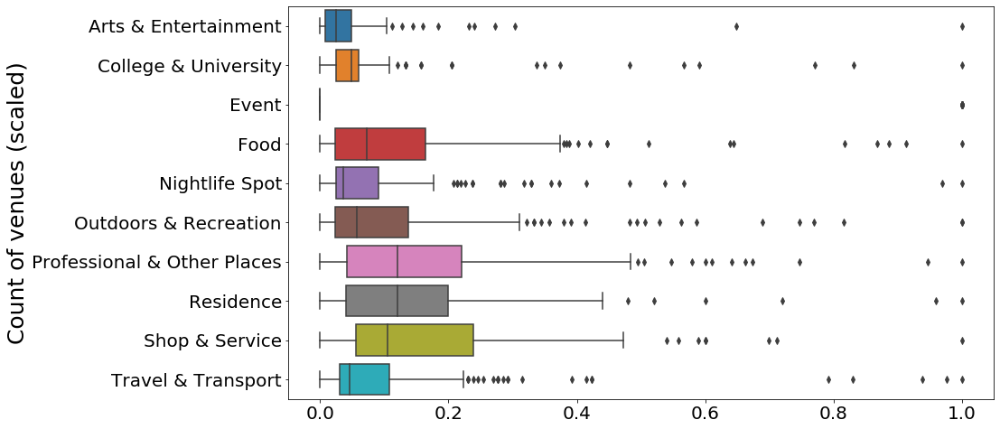

In [412]:
import seaborn as sns
plt.figure(figsize=(14,8))
ax = sns.boxplot(data = df_scaled, orient='h')
ax.set_ylabel('Count of venues (scaled)', fontsize=25)
ax.tick_params(labelsize=20)

plt.show()

Drop 'Event' category since it contains very little information and will skew further analysis 

In [484]:
#df_venues.drop('Event', 1, inplace=True)
df_scaled.drop('Event', 1, inplace=True)
#df_scaled.drop('College & University', 1, inplace = True)

### Clustering areas of London

In [485]:
# set number of clusters
kclusters = 4

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(df_scaled)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 1, 0, 1, 0, 0, 0, 0, 2, 2], dtype=int32)

In [486]:
# add clustering labels
df_venues_clustered = df_venues.copy()
df_venues_clustered.insert(0, 'Cluster Labels', kmeans.labels_)

df_venues_clustered.head() # check the last columns!

,Cluster Labels,District,Borough_x,Postcode,Latitude,Longitude,Borough_y,Dec 1995,Mar 1996,Jun 1996,Sep 1996,Dec 1996,Mar 1997,Jun 1997,Sep 1997,Dec 1997,Mar 1998,Jun 1998,Sep 1998,Dec 1998,Mar 1999,Jun 1999,Sep 1999,Dec 1999,Mar 2000,Jun 2000,Sep 2000,Dec 2000,Mar 2001,Jun 2001,Sep 2001,Dec 2001,Mar 2002,Jun 2002,Sep 2002,Dec 2002,Mar 2003,Jun 2003,Sep 2003,Dec 2003,Mar 2004,Jun 2004,Sep 2004,Dec 2004,Mar 2005,Jun 2005,Sep 2005,Dec 2005,Mar 2006,Jun 2006,Sep 2006,Dec 2006,Mar 2007,Jun 2007,Sep 2007,Dec 2007,Mar 2008,Jun 2008,Sep 2008,Dec 2008,Mar 2009,Jun 2009,Sep 2009,Dec 2009,Mar 2010,Jun 2010,Sep 2010,Dec 2010,Mar 2011,Jun 2011,Sep 2011,Dec 2011,Mar 2012,Jun 2012,Sep 2012,Dec 2012,Mar 2013,Jun 2013,Sep 2013,Dec 2013,Mar 2014,Jun 2014,Sep 2014,Dec 2014,Mar 2015,Jun 2015,Sep 2015,Dec 2015,Mar 2016,Jun 2016,Sep 2016,Dec 2016,Mar 2017,Jun 2017,Sep 2017,Dec 2017,Arts & Entertainment,College & University,Food,Nightlife Spot,Outdoors & Recreation,Professional & Other Places,Residence,Shop & Service,Travel & Transport
0,0,Abbey Wood,Bexley,SE2,51.495847,0.127708,Greenwich,46278.408451,47470.190789,46562.296053,46827.107383,49205.748503,48997.741935,49966.060606,52283.735294,54557.441176,56360.190217,58773.538012,60984.775281,63367.608696,64609.778481,65522.916667,66301.038961,68162.750000,69452.144444,73676.026178,78048.018779,80949.655502,85767.784689,87503.729469,92114.041475,96684.903766,101341.58824,106644.90909,113884.62762,121491.62963,128947.25410,135804.23828,141532.44726,147666.93581,150909.57614,155304.94639,158196.86283,161244.21818,165985.50916,164851.05263,164419.97312,162627.15517,161896.60112,165381.44330,166809.01435,170983.43852,172199.78810,174697.09825,177402.24667,178730.53597,183192.25869,185585.00000,187880.36145,190399.67480,189377.67857,181486.63158,174971.53521,170301.67532,171176.27160,172503.72000,172616.45333,175411.34286,173524.23611,173568.18182,175259.61538,170271.11111,169780.79787,170113.85556,172460.82759,174681.08989,177787.05495,179800.67416,180478.35106,191183.57843,198388.91753,207436.30909,230333.58197,247468.50000,253276.07258,263258.69643,258074.66667,282209.24219,295852.61940,303771.81379,318638.07746,326788.33621,331602.81197,333927.22018,339017.31429,341509.23762,0,1,4,6,2,3,1,6,4
1,1,Addiscombe,Croydon,CR0,51.367674,-0.095250,Croydon,58136.177370,56418.035503,56878.719403,57114.719547,56781.416667,58149.838028,60069.814159,62740.226013,64934.447761,66555.010989,68152.684783,70091.917226,72664.049107,74607.171625,76910.673660,82385.192872,87009.686424,90676.819320,95063.349091,98527.493243,104634.384830,109919.238910,115450.302080,120595.415250,122479.847770,126701.98804,133690.97593,141594.87446,152703.60433,161723.28810,170659.90377,176176.82375,179114.94798,179742.39759,179193.40120,184448.49416,188290.65289,191904.94493,197816.05596,194371.78880,194600.76709,194442.09859,193677.98925,194444.60334,199548.26210,204394.15493,207507.30705,219359.47667,224383.39789,227716.48970,232647.32447,231434.63763,225670.76852,219124.45930,211394.71429,200806.22222,197634.97630,199386.82018,201986.76423,206875.64091,212961.04145,213534.01047,213214.51744,216080.74359,214569.67822,211617.72300,216000.77465,216251.34328,215527.89744,220939.21788,216763.12155,217289.95385,224951.47234,228719.91638,235598.12013,248184.49355,261702.00000,273020.28467,283285.64483,291628.51987,299689.52632,312383.90221,322977.05797,337964.65041,348185.15730,360748.58796,360144.62633,359777.18490,364155.69291,5,6,53,25,7,40,4,53,27
2,0,Alperton,Brent,HA0,51.541077,-0.300886,Brent,57641.158537,58597.419355,58688.853503,57154.938272,57972.370166,57824.610256,60968.416268,63026.586364,67009.308756,70067.963801,71186.995413,75047.568182,75492.446602,77133.549020,80882.985000,84391.448780,89565.066667,94199.041284,98307.400901,102421.235290,106586.346340,110261.165050,127122.379000,136095.968610,141028.309920,142721.94071,138068.54839,144882.34043,151492.69406,160779.97768,167378.50230,169403.04444,180181.58371,189596.18932,196

In [487]:
df_scaled.insert(0, 'Cluster Labels', kmeans.labels_)
df_scaled.insert(0, 'District', df_venues['District'])
df_scaled

,District,Cluster Labels,Arts & Entertainment,College & University,Food,Nightlife Spot,Outdoors & Recreation,Professional & Other Places,Residence,Shop & Service,Travel & Transport
0,Abbey Wood,0,0.000,0.012048,0.013699,0.036585,0.011494,0.010526,0.04,0.030675,0.030769
1,Addiscombe,1,0.040,0.072289,0.237443,0.152439,0.068966,0.400000,0.16,0.319018,0.207692
2,Alperton,0,0.016,0.060241,0.045662,0.042683,0.034483,0.073684,0.12,0.098160,0.023077
3,Balham,1,0.096,0.072289,0.191781,0.115854,0.126437,0.231579,0.24,0.251534,0.069231
4,Barkingside,0,0.000,0.036145,0.041096,0.012195,0.034483,0.052632,0.12,0.073620,0.053846
5,Barnehurst,0,0.008,0.012048,0.118721,0.085366,0.034483,0.126316,0.04,0.239264,0.030769
6,Barnes,0,0.064,0.036145,0.063927,0.042683,0.149425,0.126316,0.08,0.098160,0.053846
7,High Barnet,0,0.032,0.060241,0.073059,0.030488,0.045977,0.178947,0.04,0.177914,0.023077
8,Barnsbury,2,0.232,0.349398,0.867580,0.567073,0.586207,0.484211,0.16,0.588957,0.423077
9,Bayswater,2,0.184,0.204819,0.885845,0.414634,0.689655,0.600000,0.96,0.429448,0.938462


In [488]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(df_venues_clustered['Latitude'], df_venues_clustered['Longitude'], df_venues_clustered['District'], df_venues_clustered['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

* 2 clusters only identified the **most** central districts and every other district as a suburb to that
* 3 clusters identified the central (zone 1) districts and some more periphery surburban districts
* 5 clusters had seemingly overlapping clusters with unclear distinction between categorisation

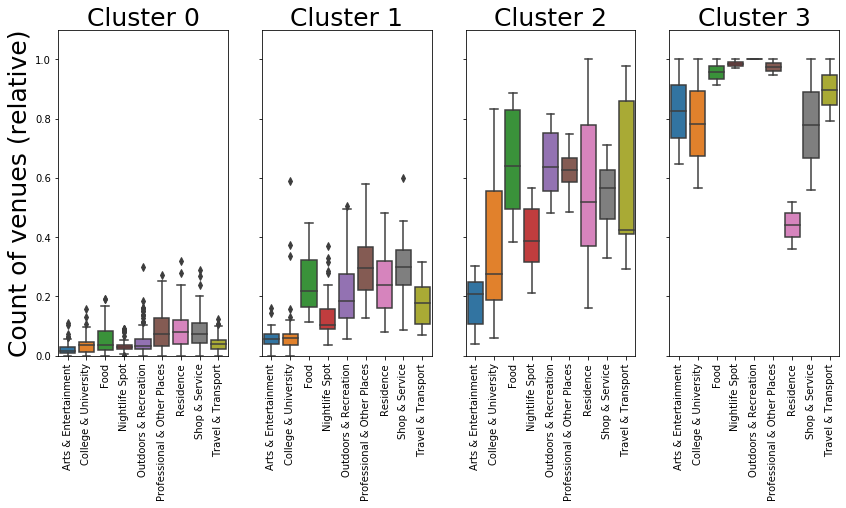

In [489]:
fig,axes= plt.subplots(1,kclusters,figsize=(14,6),sharey=True)

axes[0].set_ylabel('Count of venues (relative)', fontsize=25)
#plt.set_xlabel('Venue category', fontsize='x-large')

for k in range(0, kclusters):
    #Set same y axis limits
    axes[k].set_ylim(0,1.1)
    axes[k].xaxis.set_label_position('top')
    axes[k].set_xlabel('Cluster ' + str(k), fontsize=25)
    axes[k].tick_params(labelsize=10)
    plt.sca(axes[k])
    plt.xticks(rotation='vertical')
    sns.boxplot(data = df_scaled[df_scaled['Cluster Labels'] == k].drop(['Cluster Labels','District'],1), ax=axes[k])
plt.savefig('clusters_analysed')
plt.show()


### Plotting the avg house price

In [60]:
import matplotlib.pyplot as plt

In [531]:
cluster_0 = df_venues_clustered[df_venues_clustered['Cluster Labels']==0]
cluster_0.shape

(135, 105)

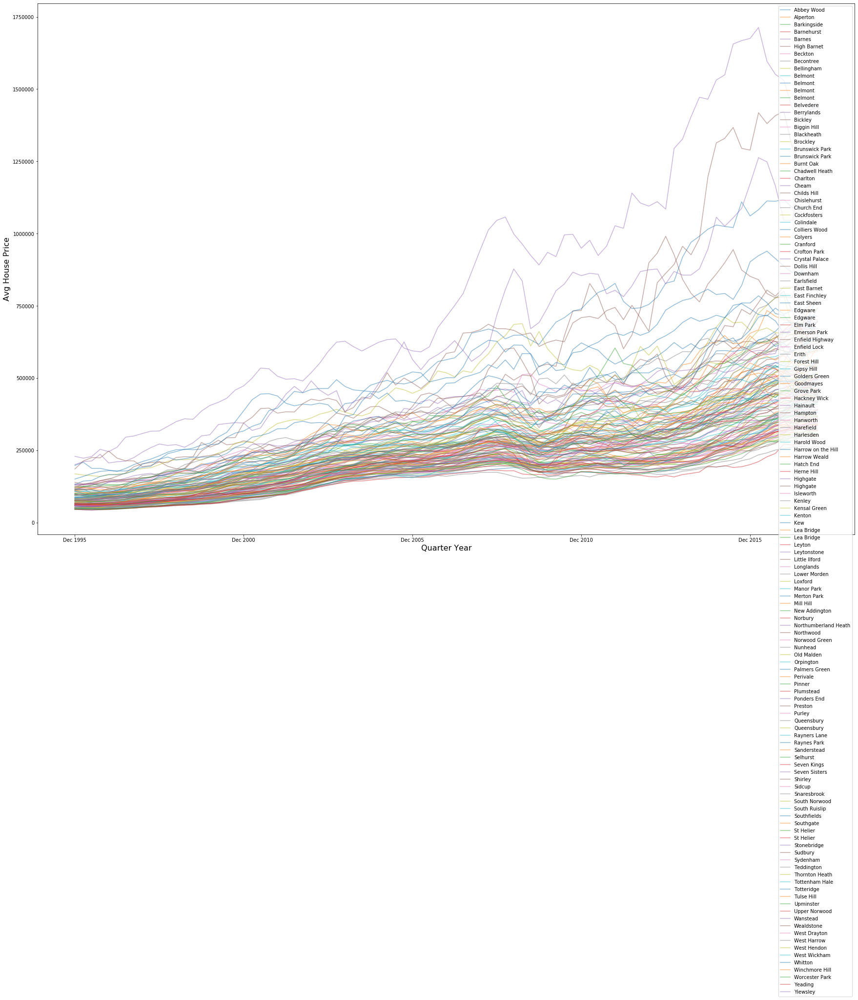

In [530]:
cluster_0.iloc[:,7:cluster_0.columns.get_loc('Arts & Entertainment')].transpose().plot(kind='line', stacked=False, alpha=0.5, figsize=(30,20))
plt.legend(cluster_0.iloc[:,1], loc='best')
plt.xlabel('Quarter Year', size=16)
plt.ylabel('Avg House Price', size=16)
plt.savefig('cluster0_prices')

In [533]:
cluster_0[cluster_0['Dec 2015'] > 750000]

,Cluster Labels,District,Borough_x,Postcode,Latitude,Longitude,Borough_y,Dec 1995,Mar 1996,Jun 1996,Sep 1996,Dec 1996,Mar 1997,Jun 1997,Sep 1997,Dec 1997,Mar 1998,Jun 1998,Sep 1998,Dec 1998,Mar 1999,Jun 1999,Sep 1999,Dec 1999,Mar 2000,Jun 2000,Sep 2000,Dec 2000,Mar 2001,Jun 2001,Sep 2001,Dec 2001,Mar 2002,Jun 2002,Sep 2002,Dec 2002,Mar 2003,Jun 2003,Sep 2003,Dec 2003,Mar 2004,Jun 2004,Sep 2004,Dec 2004,Mar 2005,Jun 2005,Sep 2005,Dec 2005,Mar 2006,Jun 2006,Sep 2006,Dec 2006,Mar 2007,Jun 2007,Sep 2007,Dec 2007,Mar 2008,Jun 2008,Sep 2008,Dec 2008,Mar 2009,Jun 2009,Sep 2009,Dec 2009,Mar 2010,Jun 2010,Sep 2010,Dec 2010,Mar 2011,Jun 2011,Sep 2011,Dec 2011,Mar 2012,Jun 2012,Sep 2012,Dec 2012,Mar 2013,Jun 2013,Sep 2013,Dec 2013,Mar 2014,Jun 2014,Sep 2014,Dec 2014,Mar 2015,Jun 2015,Sep 2015,Dec 2015,Mar 2016,Jun 2016,Sep 2016,Dec 2016,Mar 2017,Jun 2017,Sep 2017,Dec 2017,Arts & Entertainment,College & University,Food,Nightlife Spot,Outdoors & Recreation,Professional & Other Places,Residence,Shop & Service,Travel & Transport
6,0,Barnes,Richmond upon Thames,SW13,51.471896,-0.238744,Richmond upon Thames,229311.81287,222985.29412,228838.30622,253730.36437,245752.83516,260901.08889,295600.62739,299954.74359,308435.53141,316411.21303,317048.76709,333063.04130,349482.01577,359353.73841,357515.28488,386046.04261,405540.45113,416319.25735,430529.69837,458782.43750,473033.58800,499956.03015,534878.62632,532292.47368,506708.79747,496170.95331,498026.05792,490196.35338,518961.98535,551422.89734,591901.64732,624484.17085,627818.65285,608989.81481,593951.53257,609132.97101,624260.22727,633205.00000,635679.29545,603827.84091,594234.12162,590971.79204,608401.11814,675084.01626,712532.74297,751370.24627,792710.14844,867273.50000,941515.30455,1.013228e+06,1.046230e+06,1.057476e+06,998979.89216,963934.88372,924858.43373,891721.90476,935255.93750,920536.66013,995774.53448,997721.19880,949464.99390,977086.27564,924322.31333,957039.64474,1.027279e+06,1.018571e+06,1.140596e+06,1.106082e+06,1.095278e+06,1.110695e+06,1.085009e+06,1.294894e+06,1.327565e+06,1.404278e+06,1.471838e+06,1.465356e+06,1.531666e+06,1.549348e+06,1.656381e+06,1.667908e+06,1.675590e+06,1.713441e+06,1.596329e+06,1.550995e+06,1.530426e+06,1.433595e+06,1.400240e+06,1.426592e+06,1.438492e+06,8,3,15,7,14,14,2,17,7
34,0,Childs Hill,Barnet,NW2,51.562982,-0.197249,Barnet,139272.35319,133928.57919,134972.96444,144992.57621,150272.54007,160495.83758,171794.16715,193601.38544,203835.18063,208045.92487,210854.02426,195097.53699,186601.95198,185423.20635,213065.68750,247782.09896,266999.15672,284988.26598,269229.18408,272575.43059,283298.05607,277772.38487,262540.75284,240247.04751,231388.32064,236225.08073,245473.09514,256607.77251,288341.01289,325305.90462,353138.72515,379332.47214,372505.43413,361318.79817,383513.28097,400690.44242,402361.76380,387622.13855,371524.29022,372100.47119,402287.03367,441485.41356,448436.00000,438249.02761,415059.28614,392398.00587,403354.12500,425629.34595,463755.02059,5.314175e+05,5.625850e+05,6.001334e+05,604260.06716,559031.19643,506127.88785,541463.25000,548394.90909,540676.68310,646663.76970,732775.62121,734115.88000,827598.16466,783572.60965,705678.65909,6.814462e+05,6.014243e+05,6.491529e+05,7.379961e+05,8.987945e+05,9.324991e+05,9.908642e+05,9.268489e+05,8.419015e+05,7.936276e+05,7.637899e+05,8.257213e+05,8.604784e+05,8.993916e+05,9.449332e+05,8.742412e+05,8.522178e+05,8.407346e+05,7.926902e+05,7.777969e+05,7.812979e+05,7.783410e+05,8.580879e+05,8.644037e+05,8.954957e+05,4,9,17,8,12,9,5,16,8
55,0,East Sheen,Richmond upon Thames,SW14,51.462371,-0.267094,Richmond upon Thames,197970.11795,208751.41951,187782.89498,187815.17091,181842.99371,177132.19018,187147.25610,200920.90099,211321.52158,219899.48375,231089.26172,243980.36719,252333.67939,252553.48679,257784.06164,268484.16514,274607.16369,296560.25444,312378.39752,349036.19392,386947.22500,425322.12381,444909.04128,446198.43254,438293.43621,413075.53232,404220.69963,409960.79078,407409.87372,413375.09964,407773.

In [515]:
cluster_0_UD = cluster_0[cluster_0['Dec 2017'] < 500000]
cluster_0_UD.shape

(78, 105)

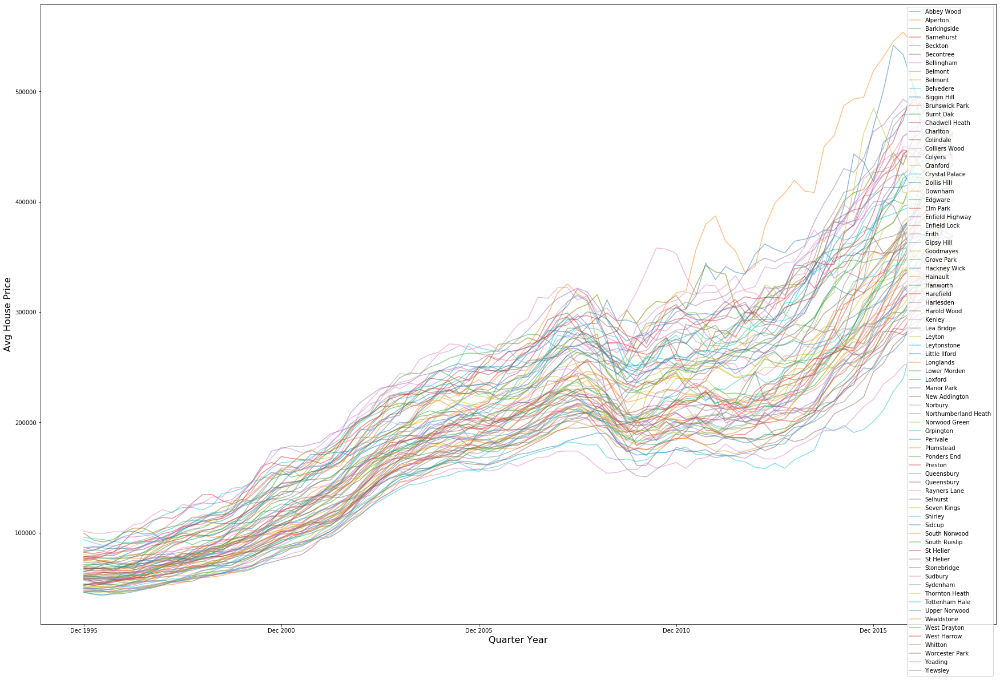

In [527]:
cluster_0_UD.iloc[:,7:cluster_0_UD.columns.get_loc('Arts & Entertainment')].transpose().plot(kind='line', stacked=False, alpha=0.5, figsize=(30,20))
plt.legend(cluster_0_UD.iloc[:,1], loc='best')
plt.xlabel('Quarter Year', size=16)
plt.ylabel('Avg House Price', size=16)
plt.savefig('cluster0UD_prices')

In [519]:
UD = cluster_0_UD['District']

In [524]:
UD

0                Abbey Wood
2                  Alperton
4               Barkingside
5                Barnehurst
10                  Beckton
11                Becontree
12               Bellingham
14                  Belmont
16                  Belmont
17                Belvedere
21              Biggin Hill
27           Brunswick Park
28                Burnt Oak
31           Chadwell Heath
32                 Charlton
40                Colindale
41            Colliers Wood
42                  Colyers
43                 Cranford
46           Crystal Palace
49              Dollis Hill
50                  Downham
57                  Edgware
58                 Elm Park
60          Enfield Highway
61             Enfield Lock
62                    Erith
66               Gipsy Hill
68                Goodmayes
70               Grove Park
72             Hackney Wick
74                 Hainault
77                 Hanworth
78                Harefield
79                Harlesden
80              Haro

In [122]:
for idx,col in enumerate(ldn_prices.columns.values[6:]):
    ldn_prices.columns.values[6:][idx] =  col[col.index('g')+2:]